In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

In [ ]:
!pip install python-igraph
!pip install leidenalg

In [38]:
import networkx as nx
from networkx.algorithms import community
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import random
import math
import leidenalg
import igraph as ig

In [39]:
def read_graph(filename):
    cols = ['source', 'target', 'rating', 'time']
    df = pd.read_csv(f'/content/gdrive/MyDrive/{filename}', names=cols, header=None)
    df['time'] = pd.to_datetime(df.time * 1e9)
    df = df.set_index('time')
    print(df)
    return df

In [40]:
def create_graph(df):
    graph = nx.DiGraph()
    edges = [(t.source, t.target, float(t.rating)) for t in df.itertuples()]
    graph.add_weighted_edges_from(edges)
    return graph

In [41]:
def get_size(user_id, m=200, min=300):
    s = review_counts.get(user_id)
    if s is not None:
        return min * s
    else:
        return min

def get_color(user_id):
    s = average_reviews.get(user_id)
    if s is None:
        return 0.5
    # need a scaling function to translate -10-10 to 0.0-1.0 for colors maps
    return np.interp(s, (-10, 10), (0, 1))

In [42]:
def calculate_statistics(graph):
    print("Nodes:", graph.number_of_nodes())
    print("Edges:", graph.number_of_edges())
    g = graph.to_undirected()
    number_of_components = nx.number_connected_components(g)
    components_size = [len(c) for c in sorted(nx.connected_components(g), key=len, reverse=True)]
    largest_cc = max(nx.connected_components(g), key=len)
    largest_cc_graph = graph.subgraph(largest_cc).copy()
    largest_cc_graph_nodes = largest_cc_graph.number_of_nodes()
    largest_cc_graph_edges = largest_cc_graph.number_of_edges()
    print("Number of connected components:", number_of_components)
    print("Size of each component (number of nodes):", components_size)
    print("Nodes in largest connected component:", largest_cc_graph_nodes)
    print("Edges in largest connected component:", largest_cc_graph_edges)
    avg_cc = nx.average_clustering(graph)
    print("Average clustering coefficient:", avg_cc)
    plt.hist([x[1] for x in list(nx.degree(graph))])
    plt.yscale('log')
    plt.show()

In [43]:
def visualize_graph(G): 
    color_map = []
    for node in G.nodes(data=True):
        if node[1]['labels'] == 'Honest':
            color_map.append('#13dff2')
        else: 
            color_map.append('#ff2c48') 

    plt.figure(3, figsize=(50, 30)) 
    nx.draw_networkx(G, node_color=color_map, with_labels=True, node_size=4000) 
    plt.show()

In [44]:
def evaluation(data, graph):
    one_type_communities = 0
    for i in range(len(data)):
        k = graph.subgraph(data[i])
        print(f"Number of users in community {i}: {len(data[i])}")

        fraudulent = 0
        honest = 0
        for node in k.nodes(data=True):
            if node[1]['labels'] == 'Honest':
                honest += 1
            else:
                fraudulent += 1
        fraudulent_percent = fraudulent/len(data[i]) * 100
        honest_percent = honest/len(data[i]) * 100
        if (fraudulent_percent == 0 and honest_percent == 0):
            continue
        if (fraudulent_percent == 100 or honest_percent == 100):
            one_type_communities += 1
        print(f"Fraudulent: {fraudulent_percent}%    Honest: {honest_percent}% ")
    print(f"Number of communities that have of nodes of only one type: {one_type_communities} ({one_type_communities/len(data)*100}%)")

**Bitcoin OTC**

Најпрво, ги вчитуваме податоците за графовите за Bitcoin Alpha и Bitcoin OTC 
платформите од соодветните csv фајлови. И двата фајла имаат иста структура, поточно во секој од нив има 4 колони од кои првите две ги означуваат идентификаторите (ids) на почетниот и крајниот јазел на секое од насочените ребра во графот. Третата колона е рејтингот кој го дал односно довербата која ја има корисникот од почетниот јазел за корисникот од крајниот јазел и таа е во граница од -10 до 10. Четвртата колона е времето (timestamp) кога е даден соодветниот рејтинг. На почеток, креираме насочен граф кој како тежини на ребрата ќе ги има соодветните вредности за доверба меѓу корисниците.

In [45]:
df_otc = read_graph('soc-sign-bitcoinotc.csv')
graph_otc = create_graph(df_otc)

                               source  target  rating
time                                                 
2010-11-08 18:45:11.728359936       6       2       4
2010-11-08 18:45:41.533780224       6       5       2
2010-11-08 19:05:40.390490112       1      15       1
2010-11-08 19:41:17.369750016       4       3       7
2010-11-08 22:10:54.447459840      13      16       8
...                               ...     ...     ...
2016-01-24 05:14:41.647290112    4499    1810       1
2016-01-24 23:50:28.049489920    2731    3901       5
2016-01-24 23:50:34.034019840    2731    4897       5
2016-01-24 23:53:52.985709824      13    1128       1
2016-01-25 01:12:03.757280000    1128      13       2

[35592 rows x 3 columns]


Во прилог, ќе направиме визуелизација на дел од графот (subsample) кој ќе ги претставува дадените рејтинзи меѓу корисниците во рамки на еден месец. Со ова сакаме да добиеме осет за тоа како се развива графот, а тоа визуелно подобро можеме да го видиме кога имаме помал дел од него. Притоа, јазлите кои што имаат добиено повеќе оценки од страна на другите корисници се поголеми. Зелените јазли се позитивно оценети во просек и тоа колку е појака зелената боја, толку другите корисници имаат повеќе доверба во нив. Со црвена боја се означени корисниците во кои во просек другите немаат доверба и тоа колку е поинтензивна бојата толку истите се поризични за правење трансакции. Долгите ребра се понегативни, додека кратки ребра се попозитивни. За позиционирање на јазлите во графот го искористивме Fruchterman-Reingold force-directed алгоритмот.

In [46]:
# ratings overview by month
df_otc.resample('M').rating.value_counts().unstack()

rating,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8,9,10
time,,,,,,,,,,,,,,,,,,,,
2010-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0,10.0,5.0,2.0,7.0,NaN,5.0,7.0,2.0,1.0
2010-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.0,26.0,4.0,6.0,3.0,1.0,NaN,2.0,1.0,NaN
2011-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.0,20.0,8.0,4.0,1.0,NaN,NaN,NaN,NaN,1.0
2011-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,158.0,49.0,20.0,5.0,5.0,2.0,1.0,2.0,1.0,2.0
2011-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,127.0,36.0,10.0,7.0,2.0,1.0,3.0,3.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-30,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,24.0,12.0,5.0,1.0,5.0,NaN,1.0,1.0,NaN,2.0
2015-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,9.0,4.0,NaN,3.0,NaN,2.0,NaN,NaN,NaN
2015-11-30,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,9.0,9.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [47]:
# this month has a good spread of ratings
df_ = df_otc.loc['2013-03']
print(f"Ratings: {len(df_)}")
df_.sample(10)

Ratings: 1426


,source,target,rating
time,,,
2013-03-23 02:50:42.360080128,3729,2296,1
2013-03-12 19:29:20.816280064,2642,2897,3
2013-03-07 23:59:44.461149952,3610,2028,1
2013-03-25 10:39:14.475469824,2647,2962,-10
2013-03-28 16:52:47.768940032,3787,3757,-10
2013-03-26 22:38:15.085860096,2647,3757,-10
2013-03-29 18:41:38.169129984,17,3759,-10
2013-03-17 09:26:31.240210176,1923,2110,1
2013-03-19 05:58:40.805670144,3571,3629,2


Го одбравме месецот март 2013 како месец во кој се оставени значителен број рејтинзи како примерок на кој ќе ја направиме ваквата визуелизација. Очекуваме јазлите во кои луѓето имаат доверба да бидат поголеми и блиску едни до други односно ребрата кои ги поврзуваат да бидат пократки. Всушност, тие треба да образуваат своевидни кластери. Јазлите во кои останатите немаат доверба треба да бидат најчесто помали и да имаат подолги ребра кои ги поврзуваат со другите јазли во графот. Тие би требало да бидат од страните на кластерите или во периферијата на целиот граф.

In [48]:
dg = nx.DiGraph()
edges = [(t.source, t.target, float(t.rating)) for t in df_.itertuples()]
dg.add_weighted_edges_from(edges)
print("Subgraph formed by the given rating during March 2013")
print(f"Nodes: {dg.number_of_nodes()}")
print(f"Edges: {dg.number_of_edges()}")

Subgraph formed by the given rating during March 2013
Nodes: 583
Edges: 1426


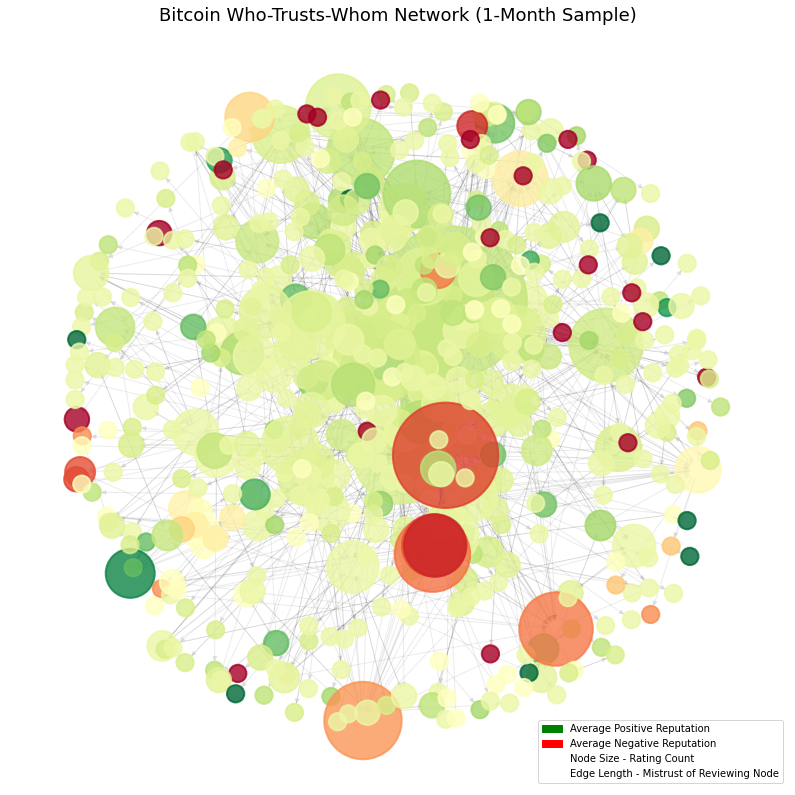

In [49]:
# build a lookup of review counts and average trust rating
review_counts = df_.groupby('target').rating.count()
average_reviews = df_.groupby('target').rating.mean()

plt.figure(figsize=(14, 14)) 
plt.title("Bitcoin Who-Trusts-Whom Network (1-Month Sample)", fontsize=18)

untrusted = mpatches.Patch(color='red', label='Average Negative Reputation')
trusted = mpatches.Patch(color='green', label='Average Positive Reputation')
size = mpatches.Patch(color='white', label='Node Size - Rating Count')
edges = mpatches.Patch(color='white', label='Edge Length - Mistrust of Reviewing Node')
plt.legend(handles=[trusted, untrusted, size, edges], loc='lower right')

pos = nx.spring_layout(dg, k=0.25)
sizes = [get_size(n) for n in dg]
colors = [get_color(n) for n in dg]

nc = nx.draw_networkx_nodes(
    dg, pos, nodelist=dg.nodes(), node_size=sizes, linewidths=2.0,
    node_color=colors, cmap=plt.cm.RdYlGn, alpha=0.8
)
ec = nx.draw_networkx_edges(dg, pos, arrows=True, alpha=0.08)
ax = plt.axis('off')
plt.show()

Гледаме дека дел од нашите претпоставки се исполнија, но има и дел црвени јазли кои се големи и се подобро инкорпорирани во самата мрежа.

Понатаму, пресметуваме основни статистики за графот за да добиеме подобар преглед на тоа со што ќе работиме понатаму и каква е структурата. Всушност, го пресметуваме бројот на јазли и ребра, правиме график за распределбата на степенот на јазлите, пресметуваме број на поврзани компоненти, како и нивната големина. На крај го одредуваме и просечниот кластерирачки коефициент.

Nodes: 5881
Edges: 35592
Number of connected components: 4
Size of each component (number of nodes): [5875, 2, 2, 2]
Nodes in largest connected component: 5875
Edges in largest connected component: 35587
Average clustering coefficient: 0.15106980550907195


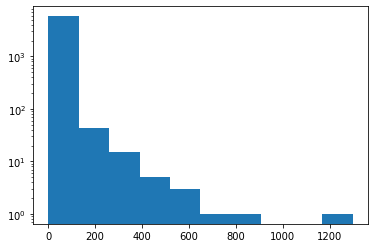

In [50]:
calculate_statistics(graph_otc)

Бидејќи од претходно пресметаните статистики на графот увидовме дека постои една огромна поврзана компонента со 5881 јазли и три помали со само 2 јазли, при детектирањето на заедниците со различните алгоритми ќе ја користиме само џиновската компонента. Во спротивно, би добиле дека секоја поврзана компонента е посебна заедница што нема на никаков начин да ни помогне во истражувањето. Целта е да увидиме дали измамниците се одвоени во посебни заедници според структурата на мрежата и со тоа лесно можеме да ги детектираме, или пак, се имаат добро интегрирано во различните заедници. 

In [51]:
g = graph_otc.to_undirected()
components = [c for c in sorted(nx.connected_components(g), key=len, reverse=True)]
for c in components[1:]:
    graph_otc.remove_nodes_from(c)

За секој јазел го пресметуваме неговиот влезен степен како збир од тежините на ребрата кои влегуваат во него. Оваа мерка означува колку еден корисник ужива (не)доверба од заедницата на платформата за тргување со Bitcoin.

In [52]:
in_degree = graph_otc.in_degree(weight='weight')

Доколку вака пресметаниот влезен степен е поголем од 0, можеме да претпоставиме дека овој корисник е чесен бидејќи повеќето други корисници го сметаат за таков. Во спротивниот случај, кога тој степен на доверба е помал или еднаков на нула, корисникот го класифицираме како измамник. Ги раздвојуваме измамниците и чесните корисници во мрежата и го пресметуваме нивниот број.

In [53]:
user_labels_otc = {}
num_honest_users = 0
num_fraudulent_users = 0
honest_users = []
fraudulent_users = []
for (k, v) in in_degree:
    if v > 0:
        user_labels_otc[k] = 1
        num_honest_users += 1
        honest_users.append(k)
    else:
        user_labels_otc[k] = 0
        num_fraudulent_users += 1
        fraudulent_users.append(k)

print(f'Honest users: {num_honest_users}')
print(f'Fraudulent users: {num_fraudulent_users}')

Honest users: 5004
Fraudulent users: 871


Потоа, ги лабелираме јазлите во графот според претходно утврдениот тип на корисник.

In [54]:
node_labels = {}
for node in list(graph_otc.nodes()):
    if node in fraudulent_users:
        node_labels[node] = "Fraudulent"
    else:
        node_labels[node] = "Honest"
nx.set_node_attributes(graph_otc, node_labels, "labels")
print(graph_otc.nodes(data=True))

[(6, {'labels': 'Honest'}), (2, {'labels': 'Honest'}), (5, {'labels': 'Honest'}), (1, {'labels': 'Honest'}), (15, {'labels': 'Honest'}), (4, {'labels': 'Honest'}), (3, {'labels': 'Fraudulent'}), (13, {'labels': 'Honest'}), (16, {'labels': 'Honest'}), (10, {'labels': 'Honest'}), (7, {'labels': 'Honest'}), (21, {'labels': 'Honest'}), (20, {'labels': 'Honest'}), (8, {'labels': 'Honest'}), (17, {'labels': 'Honest'}), (23, {'labels': 'Honest'}), (25, {'labels': 'Honest'}), (26, {'labels': 'Honest'}), (28, {'labels': 'Honest'}), (29, {'labels': 'Honest'}), (31, {'labels': 'Honest'}), (32, {'labels': 'Honest'}), (34, {'labels': 'Honest'}), (35, {'labels': 'Honest'}), (36, {'labels': 'Honest'}), (37, {'labels': 'Honest'}), (44, {'labels': 'Fraudulent'}), (39, {'labels': 'Honest'}), (45, {'labels': 'Honest'}), (19, {'labels': 'Honest'}), (46, {'labels': 'Honest'}), (47, {'labels': 'Honest'}), (51, {'labels': 'Honest'}), (52, {'labels': 'Honest'}), (53, {'labels': 'Honest'}), (54, {'labels': 'Ho

Ги визуелизираме јазлите во графот така што чесните корисници се обоени со сино, а измамниците со црвена боја.

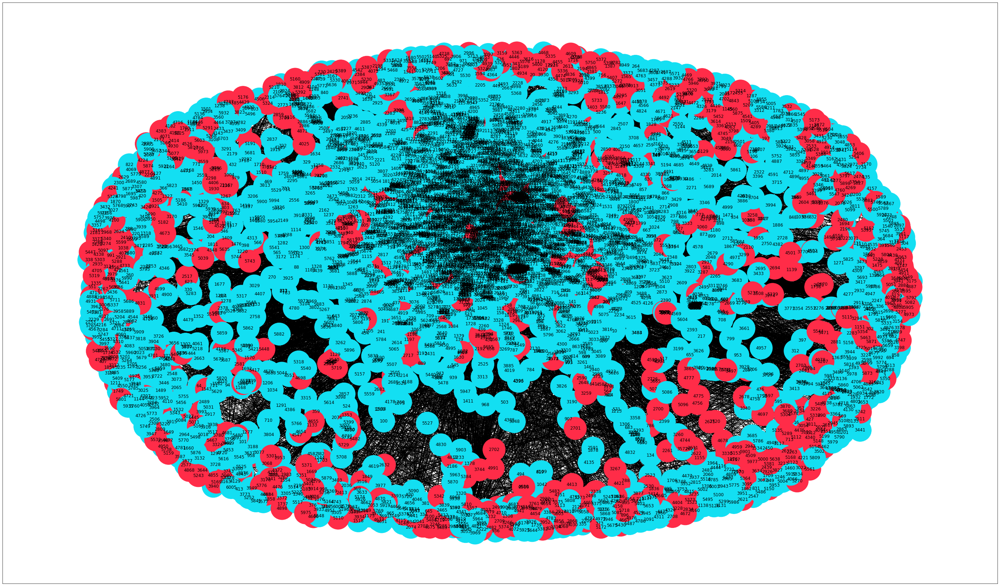

In [55]:
visualize_graph(graph_otc)

In [56]:
graph_otc_positive = graph_otc.copy()
for u, v in graph_otc.edges():
    if graph_otc_positive[u][v]['weight'] <= 0:
        graph_otc_positive.remove_edge(u, v)

In [57]:
undirected_graph_otc = nx.Graph()
undirected_graph_otc.add_edges_from(graph_otc_positive.edges(), weight=0)
for u, v, d in graph_otc_positive.edges(data=True):
    undirected_graph_otc[u][v]['weight'] += d['weight']
print(undirected_graph_otc.edges(data=True))

[(6, 2, {'weight': 9.0}), (6, 5, {'weight': 5.0}), (6, 4, {'weight': 7.0}), (6, 7, {'weight': 8.0}), (6, 114, {'weight': 2.0}), (6, 32, {'weight': 2.0}), (6, 173, {'weight': 3.0}), (6, 258, {'weight': 2.0}), (6, 268, {'weight': 6.0}), (6, 219, {'weight': 6.0}), (6, 198, {'weight': 2.0}), (6, 35, {'weight': 6.0}), (6, 664, {'weight': 3.0}), (6, 937, {'weight': 3.0}), (6, 384, {'weight': 6.0}), (6, 521, {'weight': 3.0}), (6, 280, {'weight': 2.0}), (6, 687, {'weight': 1.0}), (6, 1386, {'weight': 8.0}), (6, 537, {'weight': 10.0}), (6, 1317, {'weight': 7.0}), (6, 1566, {'weight': 2.0}), (6, 2034, {'weight': 2.0}), (6, 2455, {'weight': 1.0}), (6, 1810, {'weight': 5.0}), (6, 2028, {'weight': 3.0}), (6, 1363, {'weight': 11.0}), (6, 10, {'weight': 10.0}), (6, 1, {'weight': 16.0}), (6, 1018, {'weight': 3.0}), (6, 1832, {'weight': 2.0}), (6, 1624, {'weight': 3.0}), (6, 550, {'weight': 2.0}), (6, 2642, {'weight': 4.0}), (6, 856, {'weight': 13.0}), (6, 2188, {'weight': 9.0}), (6, 2187, {'weight': 7

In [79]:
communities_label_propagation = list(community.label_propagation_communities(undirected_graph_otc))
print("Number of communities using Label Propagation:", len(communities_label_propagation))
evaluation(communities_label_propagation, graph_otc)

Number of communities using Label Propagation: 136
Number of users in community 0: 5093
Fraudulent: 6.950716669939132%    Honest: 93.04928333006087% 
Number of users in community 1: 4
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 2: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 3: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 4: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 5: 5
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 6: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 7: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 8: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 9: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 10: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 11: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 12: 6
Fraudulent: 0.0%    Honest: 100.0% 
Number 

In [59]:
g_temp = undirected_graph_otc
g_temp = nx.Graph(g_temp)
K5 = nx.convert_node_labels_to_integers(g_temp, first_label = 2)
g_temp.add_edges_from(K5.edges());
c = list(community.k_clique_communities(g_temp, 3))
res = list(c)
print("Number of communities using K-Clique:", len(res))

communities_k_clique = []
for item in res:
    communities_k_clique.append(list(item))

evaluation(communities_k_clique, graph_otc)

Number of communities using K-Clique: 138
Number of users in community 0: 3954
Fraudulent: 11.077389984825494%    Honest: 87.50632271117856% 
Number of users in community 1: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 2: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 3: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 4: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 5: 3
Fraudulent: 33.33333333333333%    Honest: 66.66666666666666% 
Number of users in community 6: 3
Fraudulent: 33.33333333333333%    Honest: 66.66666666666666% 
Number of users in community 7: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 8: 5
Fraudulent: 20.0%    Honest: 60.0% 
Number of users in community 9: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 10: 4
Fraudulent: 50.0%    Honest: 25.0% 
Number of users in community 11: 4
Fraudulent: 0.0%    Honest: 75.0% 
Number of users in community 12: 4


In [60]:
undirected_graph_otc2 = nx.Graph()
undirected_graph_otc2.add_edges_from(graph_otc.edges())
communities_fluid = list(community.asyn_fluidc(undirected_graph_otc2, 20))
print("Number of communities using Fluid Communities:", len(communities_fluid))
evaluation(communities_fluid, graph_otc)

Number of communities using Fluid Communities: 20
Number of users in community 0: 270
Fraudulent: 17.037037037037038%    Honest: 82.96296296296296% 
Number of users in community 1: 432
Fraudulent: 50.0%    Honest: 50.0% 
Number of users in community 2: 322
Fraudulent: 5.279503105590062%    Honest: 94.72049689440993% 
Number of users in community 3: 256
Fraudulent: 4.6875%    Honest: 95.3125% 
Number of users in community 4: 271
Fraudulent: 6.642066420664207%    Honest: 93.35793357933579% 
Number of users in community 5: 210
Fraudulent: 17.61904761904762%    Honest: 82.38095238095238% 
Number of users in community 6: 206
Fraudulent: 5.825242718446602%    Honest: 94.1747572815534% 
Number of users in community 7: 295
Fraudulent: 15.254237288135593%    Honest: 84.7457627118644% 
Number of users in community 8: 386
Fraudulent: 19.4300518134715%    Honest: 80.56994818652849% 
Number of users in community 9: 282
Fraudulent: 5.319148936170213%    Honest: 94.68085106382979% 
Number of users in

In [61]:
undirected_igraph_otc = ig.Graph.from_networkx(undirected_graph_otc)
leidenalg_partition = leidenalg.find_partition(undirected_igraph_otc, leidenalg.ModularityVertexPartition);
print("Number of communities using Leiden algorithm:", len(leidenalg_partition))
evaluation(leidenalg_partition, graph_otc)

Number of communities using Leiden algorithm: 33
Number of users in community 0: 1135
Fraudulent: 8.722466960352424%    Honest: 87.84140969162996% 
Number of users in community 1: 973
Fraudulent: 23.12435765673176%    Honest: 75.53956834532374% 
Number of users in community 2: 821
Fraudulent: 14.494518879415347%    Honest: 83.55663824604142% 
Number of users in community 3: 772
Fraudulent: 8.808290155440414%    Honest: 89.24870466321244% 
Number of users in community 4: 722
Fraudulent: 8.86426592797784%    Honest: 90.4432132963989% 
Number of users in community 5: 555
Fraudulent: 18.37837837837838%    Honest: 80.72072072072072% 
Number of users in community 6: 248
Fraudulent: 23.387096774193548%    Honest: 74.19354838709677% 
Number of users in community 7: 83
Fraudulent: 18.072289156626507%    Honest: 81.92771084337349% 
Number of users in community 8: 68
Fraudulent: 7.352941176470589%    Honest: 91.17647058823529% 
Number of users in community 9: 41
Fraudulent: 17.073170731707318%   

**Bitcoin Alpha**

In [62]:
df_alpha = read_graph('soc-sign-bitcoinalpha.csv')
graph_alpha = create_graph(df_alpha)

                     source  target  rating
time                                       
2014-08-08 04:00:00    7188       1      10
2013-08-15 04:00:00     430       1      10
2013-05-28 04:00:00    3134       1      10
2012-10-12 04:00:00    3026       1      10
2012-09-17 04:00:00    3010       1      10
...                     ...     ...     ...
2013-03-26 04:00:00    7604    7601      10
2013-03-26 04:00:00    7601    7604      10
2013-03-26 04:00:00    7604    7602      10
2013-03-26 04:00:00    7602    7604      10
2013-03-26 04:00:00    7604    7603     -10

[24186 rows x 3 columns]


In [63]:
# ratings overview by month
df_alpha.resample('M').rating.value_counts().unstack()

rating,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8,9,10
time,,,,,,,,,,,,,,,,,,,,
2010-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,8.0,3.0,1.0,5.0,NaN,2.0,7.0,2.0,NaN
2010-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,18.0,4.0,3.0,3.0,NaN,NaN,NaN,1.0,NaN
2011-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.0,10.0,7.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN
2011-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.0,36.0,18.0,4.0,4.0,2.0,1.0,1.0,1.0,NaN
2011-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118.0,34.0,9.0,7.0,1.0,NaN,3.0,3.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,17.0,5.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,3.0,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
# this month has a good spread of ratings
df_ = df_alpha.loc['2013-03']
print(f"Ratings: {len(df_)}")
df_.sample(10)

Ratings: 821


,source,target,rating
time,,,
2013-03-25 04:00:00,1537,1182,1
2013-03-20 04:00:00,2332,754,1
2013-03-08 05:00:00,2324,1,1
2013-03-23 04:00:00,599,244,1
2013-03-08 05:00:00,5342,516,-3
2013-03-30 04:00:00,278,227,1
2013-03-27 04:00:00,98,7,4
2013-03-25 04:00:00,244,80,10
2013-03-26 04:00:00,228,124,-10


In [65]:
dg = nx.DiGraph()
edges = [(t.source, t.target, float(t.rating)) for t in df_.itertuples()]
dg.add_weighted_edges_from(edges)
print("Subgraph formed by the given rating during March 2013")
print(f"Nodes: {dg.number_of_nodes()}")
print(f"Edges: {dg.number_of_edges()}")

Subgraph formed by the given rating during March 2013
Nodes: 347
Edges: 821


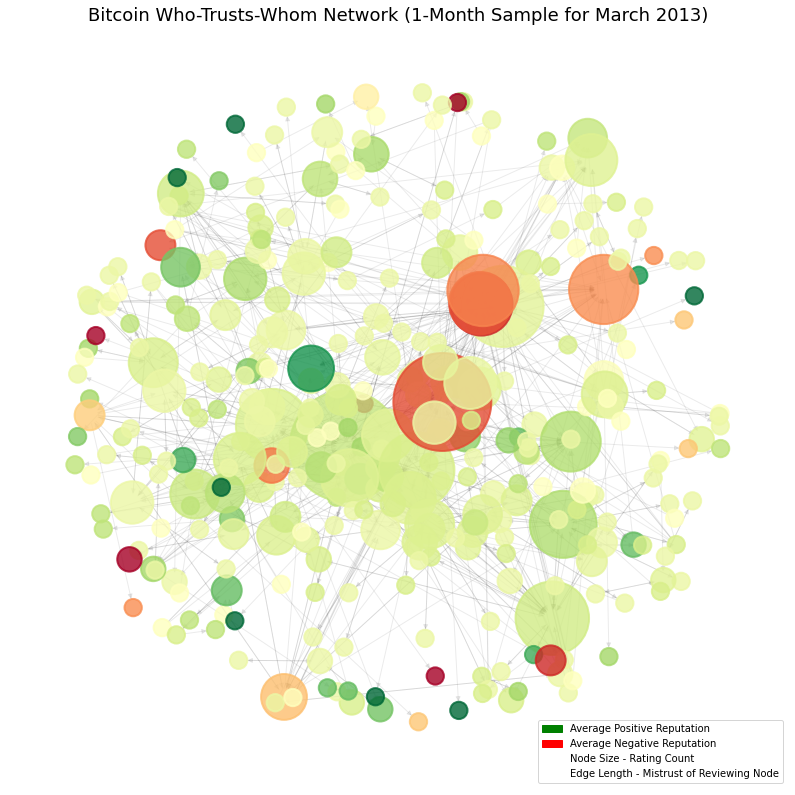

In [66]:
# build a lookup of review counts and average trust rating
review_counts = df_.groupby('target').rating.count()
average_reviews = df_.groupby('target').rating.mean()

plt.figure(figsize=(14, 14)) 
plt.title("Bitcoin Who-Trusts-Whom Network (1-Month Sample for March 2013)", fontsize=18)

untrusted = mpatches.Patch(color='red', label='Average Negative Reputation')
trusted = mpatches.Patch(color='green', label='Average Positive Reputation')
size = mpatches.Patch(color='white', label='Node Size - Rating Count')
edges = mpatches.Patch(color='white', label='Edge Length - Mistrust of Reviewing Node')
plt.legend(handles=[trusted, untrusted, size, edges], loc='lower right')

pos = nx.spring_layout(dg, k=0.25)
sizes = [get_size(n) for n in dg]
colors = [get_color(n) for n in dg]

nc = nx.draw_networkx_nodes(
    dg, pos, nodelist=dg.nodes(), node_size=sizes, linewidths=2.0,
    node_color=colors, cmap=plt.cm.RdYlGn, alpha=0.8
)
ec = nx.draw_networkx_edges(dg, pos, arrows=True, alpha=0.08)
ax = plt.axis('off')
plt.show()

Nodes: 3783
Edges: 24186
Number of connected components: 5
Size of each component (number of nodes): [3775, 2, 2, 2, 2]
Nodes in largest connected component: 3775
Edges in largest connected component: 24180
Average clustering coefficient: 0.15834486458303135


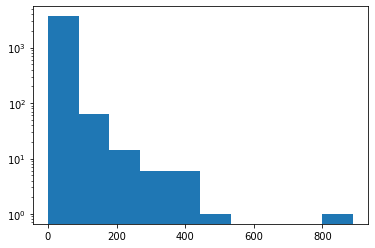

In [67]:
calculate_statistics(graph_alpha)

In [68]:
g = graph_alpha.to_undirected()
components = [c for c in sorted(nx.connected_components(g), key=len, reverse=True)]
for c in components[1:]:
    graph_alpha.remove_nodes_from(c)

In [69]:
in_degree = graph_alpha.in_degree(weight='weight')

In [70]:
user_labels_alpha = {}
num_honest_users = 0
num_fraudulent_users = 0
honest_users = []
fraudulent_users = []
for (k, v) in in_degree:
    if v > 0:
        user_labels_alpha[k] = 1
        num_honest_users += 1
        honest_users.append(k)
    else:
        user_labels_alpha[k] = 0
        num_fraudulent_users += 1
        fraudulent_users.append(k)

print(f'Honest users: {num_honest_users}')
print(f'Fraudulent users: {num_fraudulent_users}')

Honest users: 3446
Fraudulent users: 329


In [71]:
node_labels = {}
for node in list(graph_alpha.nodes()):
    if node in fraudulent_users:
        node_labels[node] = "Fraudulent"
    else:
        node_labels[node] = "Honest"
nx.set_node_attributes(graph_alpha, node_labels, "labels")
print(graph_alpha.nodes(data=True))

[(7188, {'labels': 'Fraudulent'}), (1, {'labels': 'Honest'}), (430, {'labels': 'Honest'}), (3134, {'labels': 'Honest'}), (3026, {'labels': 'Honest'}), (3010, {'labels': 'Honest'}), (804, {'labels': 'Honest'}), (160, {'labels': 'Honest'}), (95, {'labels': 'Honest'}), (377, {'labels': 'Honest'}), (888, {'labels': 'Honest'}), (89, {'labels': 'Honest'}), (1901, {'labels': 'Honest'}), (161, {'labels': 'Honest'}), (256, {'labels': 'Honest'}), (351, {'labels': 'Honest'}), (3329, {'labels': 'Honest'}), (3341, {'labels': 'Honest'}), (649, {'labels': 'Honest'}), (1583, {'labels': 'Honest'}), (87, {'labels': 'Honest'}), (37, {'labels': 'Honest'}), (309, {'labels': 'Honest'}), (821, {'labels': 'Honest'}), (1496, {'labels': 'Honest'}), (637, {'labels': 'Honest'}), (964, {'labels': 'Honest'}), (594, {'labels': 'Honest'}), (2249, {'labels': 'Honest'}), (554, {'labels': 'Honest'}), (20, {'labels': 'Honest'}), (2227, {'labels': 'Honest'}), (1315, {'labels': 'Honest'}), (519, {'labels': 'Honest'}), (131

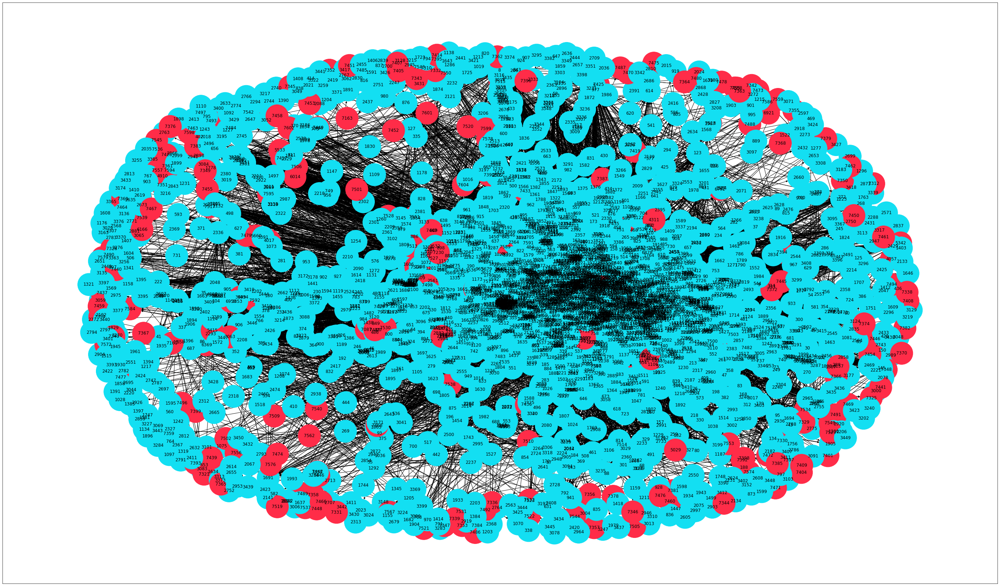

In [72]:
visualize_graph(graph_alpha)

In [73]:
graph_alpha_positive = graph_alpha.copy()
for u, v in graph_alpha.edges():
    if graph_alpha_positive[u][v]['weight'] <= 0:
        graph_alpha_positive.remove_edge(u, v)

In [74]:
undirected_graph_alpha = nx.Graph()
undirected_graph_alpha.add_edges_from(graph_alpha_positive.edges(), weight=0)
for u, v, d in graph_alpha_positive.edges(data=True):
    undirected_graph_alpha[u][v]['weight'] += d['weight']
print(undirected_graph_alpha.edges(data=True))

[(7188, 1, {'weight': 10.0}), (1, 160, {'weight': 20.0}), (1, 1028, {'weight': 7.0}), (1, 309, {'weight': 10.0}), (1, 11, {'weight': 9.0}), (1, 594, {'weight': 10.0}), (1, 1316, {'weight': 10.0}), (1, 1392, {'weight': 6.0}), (1, 1583, {'weight': 9.0}), (1, 888, {'weight': 11.0}), (1, 637, {'weight': 9.0}), (1, 1520, {'weight': 5.0}), (1, 18, {'weight': 9.0}), (1, 35, {'weight': 8.0}), (1, 1901, {'weight': 9.0}), (1, 44, {'weight': 6.0}), (1, 10, {'weight': 6.0}), (1, 783, {'weight': 6.0}), (1, 821, {'weight': 8.0}), (1, 112, {'weight': 7.0}), (1, 964, {'weight': 8.0}), (1, 89, {'weight': 10.0}), (1, 20, {'weight': 8.0}), (1, 256, {'weight': 9.0}), (1, 223, {'weight': 6.0}), (1, 1881, {'weight': 4.0}), (1, 351, {'weight': 7.0}), (1, 196, {'weight': 4.0}), (1, 416, {'weight': 4.0}), (1, 1877, {'weight': 4.0}), (1, 87, {'weight': 7.0}), (1, 2367, {'weight': 2.0}), (1, 3254, {'weight': 6.0}), (1, 1573, {'weight': 4.0}), (1, 247, {'weight': 3.0}), (1, 1353, {'weight': 4.0}), (1, 493, {'weig

In [75]:
communities_label_propagation = list(community.label_propagation_communities(undirected_graph_alpha))
print("Number of communities using Label Propagation:", len(communities_label_propagation))
evaluation(communities_label_propagation, graph_alpha)

Number of communities using Label Propagation: 97
Number of users in community 0: 3166
Fraudulent: 5.369551484523058%    Honest: 94.63044851547694% 
Number of users in community 1: 4
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 2: 189
Fraudulent: 7.936507936507936%    Honest: 92.06349206349206% 
Number of users in community 3: 4
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 4: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 5: 45
Fraudulent: 2.2222222222222223%    Honest: 97.77777777777777% 
Number of users in community 6: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 7: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 8: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 9: 8
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 10: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 11: 2
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in comm

In [76]:
g_temp = undirected_graph_alpha
g_temp = nx.Graph(g_temp)
K5 = nx.convert_node_labels_to_integers(g_temp, first_label = 2)
g_temp.add_edges_from(K5.edges());
c = list(community.k_clique_communities(g_temp, 3))
res = list(c)
print("Number of communities using K-Clique:", len(res))

communities_k_clique = []
for item in res:
    communities_k_clique.append(list(item))

evaluation(communities_k_clique, graph_alpha)

Number of communities using K-Clique: 72
Number of users in community 0: 2385
Fraudulent: 4.234800838574423%    Honest: 95.51362683438155% 
Number of users in community 1: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 2: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 3: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 4: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 5: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 6: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 7: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 8: 4
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 9: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 10: 3
Fraudulent: 33.33333333333333%    Honest: 66.66666666666666% 
Number of users in community 11: 3
Fraudulent: 0.0%    Honest: 100.0% 
Number of users in community 12: 3
Fraudulent: 0.0%    Honest:

In [77]:
undirected_graph_alpha2 = nx.Graph()
undirected_graph_alpha2.add_edges_from(graph_alpha.edges())
communities_fluid = list(community.asyn_fluidc(undirected_graph_alpha2, 20))
print("Number of communities using Fluid Communities:", len(communities_fluid))
evaluation(communities_fluid, graph_alpha)

Number of communities using Fluid Communities: 20
Number of users in community 0: 212
Fraudulent: 5.660377358490567%    Honest: 94.33962264150944% 
Number of users in community 1: 244
Fraudulent: 0.819672131147541%    Honest: 99.18032786885246% 
Number of users in community 2: 186
Fraudulent: 5.913978494623656%    Honest: 94.08602150537635% 
Number of users in community 3: 195
Fraudulent: 7.179487179487179%    Honest: 92.82051282051282% 
Number of users in community 4: 177
Fraudulent: 7.909604519774012%    Honest: 92.09039548022598% 
Number of users in community 5: 177
Fraudulent: 15.254237288135593%    Honest: 84.7457627118644% 
Number of users in community 6: 178
Fraudulent: 7.865168539325842%    Honest: 92.13483146067416% 
Number of users in community 7: 170
Fraudulent: 3.5294117647058822%    Honest: 96.47058823529412% 
Number of users in community 8: 190
Fraudulent: 5.7894736842105265%    Honest: 94.21052631578948% 
Number of users in community 9: 246
Fraudulent: 13.008130081300814

In [78]:
undirected_igraph_alpha = ig.Graph.from_networkx(undirected_graph_alpha)
leidenalg_partition = leidenalg.find_partition(undirected_igraph_alpha, leidenalg.ModularityVertexPartition);
print("Number of communities using Leiden algorithm:", len(leidenalg_partition))
evaluation(leidenalg_partition, graph_alpha)

Number of communities using Leiden algorithm: 29
Number of users in community 0: 925
Fraudulent: 0.21621621621621623%    Honest: 93.83783783783784% 
Number of users in community 1: 775
Fraudulent: 0.0%    Honest: 97.54838709677419% 
Number of users in community 2: 584
Fraudulent: 0.0%    Honest: 98.45890410958904% 
Number of users in community 3: 493
Fraudulent: 0.0%    Honest: 95.53752535496957% 
Number of users in community 4: 253
Fraudulent: 0.0%    Honest: 95.65217391304348% 
Number of users in community 5: 214
Fraudulent: 0.0%    Honest: 96.26168224299066% 
Number of users in community 6: 163
Fraudulent: 0.0%    Honest: 86.50306748466258% 
Number of users in community 7: 102
Fraudulent: 0.0%    Honest: 84.31372549019608% 
Number of users in community 8: 47
Fraudulent: 0.0%    Honest: 63.829787234042556% 
Number of users in community 9: 32
Fraudulent: 0.0%    Honest: 62.5% 
Number of users in community 10: 11
Fraudulent: 0.0%    Honest: 90.9090909090909% 
Number of users in communi